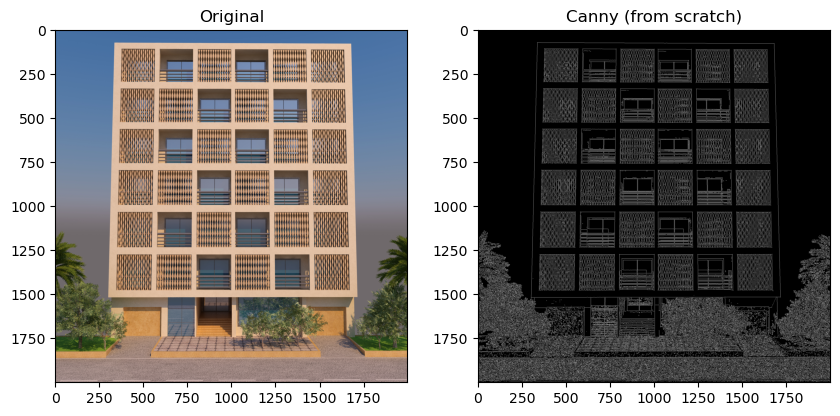

In [1]:
import cv2
import numpy as np
import math
from scipy import ndimage
import matplotlib.pyplot as plt

# ---------- Step 1: Convolution ----------
def convolution2d(image, kernel):
    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape
    padding_h = (kernel_h - 1) // 2
    padding_w = (kernel_w - 1) // 2

    padded_image = np.pad(image, ((padding_h, padding_h), (padding_w, padding_w)), mode='constant', constant_values=0)
    output = np.zeros((image_h, image_w))

    for i in range(image_h):
        for j in range(image_w):
            region = padded_image[i:i+kernel_h, j:j+kernel_w]
            output[i, j] = np.sum(region * kernel)
    return output

# ---------- Step 2: Gaussian Filter ----------
def gaussian_filter2d(sigma):
    size = int(2 * (np.ceil(3 * sigma)) + 1)  # size based on 3σ rule
    kernel = np.zeros((size, size))
    for x in range(size):
        for y in range(size):
            x_val = x - size // 2
            y_val = y - size // 2
            kernel[x, y] = (1/(2 * np.pi * sigma**2)) * np.exp(-(x_val**2 + y_val**2) / (2 * sigma**2))
    return kernel / np.sum(kernel)

# ---------- Step 3: Gradient (Sobel) ----------
def gradient(image):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    Gx = convolution2d(image, sobel_x)
    Gy = convolution2d(image, sobel_y)

    mag = np.sqrt(Gx**2 + Gy**2)
    angle = np.arctan2(Gy, Gx) * 180 / np.pi
    angle[angle < 0] += 180  # normalize 0–180
    return mag, angle

# ---------- Step 4: Non-Maximum Suppression ----------
def non_max_suppression(mag, angle):
    h, w = mag.shape
    Z = np.zeros((h, w), dtype=np.float32)
    angle = angle % 180

    for i in range(1, h-1):
        for j in range(1, w-1):
            q = 255
            r = 255

            # angle 0
            if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                q = mag[i, j+1]
                r = mag[i, j-1]
            # angle 45
            elif (22.5 <= angle[i,j] < 67.5):
                q = mag[i+1, j-1]
                r = mag[i-1, j+1]
            # angle 90
            elif (67.5 <= angle[i,j] < 112.5):
                q = mag[i+1, j]
                r = mag[i-1, j]
            # angle 135
            elif (112.5 <= angle[i,j] < 157.5):
                q = mag[i-1, j-1]
                r = mag[i+1, j+1]

            if (mag[i,j] >= q) and (mag[i,j] >= r):
                Z[i,j] = mag[i,j]
            else:
                Z[i,j] = 0
    return Z

# ---------- Step 5: Double Threshold ----------
def double_threshold(img, low, high):
    strong = 255
    weak = 75

    strong_i, strong_j = np.where(img >= high)
    weak_i, weak_j = np.where((img <= high) & (img >= low))

    res = np.zeros_like(img, dtype=np.uint8)
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return res, weak, strong

# ---------- Step 6: Hysteresis ----------
def hysteresis(img, weak, strong=255):
    h, w = img.shape
    for i in range(1, h-1):
        for j in range(1, w-1):
            if img[i,j] == weak:
                if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                    or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                    or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                    img[i,j] = strong
                else:
                    img[i,j] = 0
    return img

# ---------- Main Canny Function ----------
def canny(image, sigma=1, low=50, high=100):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    gauss = gaussian_filter2d(sigma)
    smoothed = convolution2d(gray, gauss)

    mag, angle = gradient(smoothed)
    nonmax = non_max_suppression(mag, angle)
    dt, weak, strong = double_threshold(nonmax, low, high)
    final = hysteresis(dt, weak, strong)

    return final

# ---------- Example Run ----------
if __name__ == "__main__":
    # Example: use your own images here
    img = cv2.imread("Building.jpg")  
    edges = canny(img, sigma=1, low=10, high=20)
    plt.figure(figsize=(10,5))
    plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title("Original")
    plt.subplot(122), plt.imshow(edges, cmap='gray'), plt.title("Canny (from scratch)")
    plt.show()


In [5]:
import cv2
import numpy as np
import math
from scipy import ndimage
import matplotlib.pyplot as plt

# ---------- Step 1: Convolution ----------
def convolution2d(image, kernel):
    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape
    padding_h = (kernel_h - 1) // 2
    padding_w = (kernel_w - 1) // 2

    padded_image = np.pad(image, ((padding_h, padding_h), (padding_w, padding_w)), mode='constant', constant_values=0)
    output = np.zeros((image_h, image_w))

    for i in range(image_h):
        for j in range(image_w):
            region = padded_image[i:i+kernel_h, j:j+kernel_w]
            output[i, j] = np.sum(region * kernel)
    return output

# ---------- Step 2: Gaussian Filter ----------
def gaussian_filter2d(sigma):
    size = int(2 * (np.ceil(3 * sigma)) + 1)  # Ensure minimum 5x5 for sigma ~1
    if size < 5:
        size = 5
    kernel = np.zeros((size, size))
    for x in range(size):
        for y in range(size):
            x_val = x - size // 2
            y_val = y - size // 2
            kernel[x, y] = (1/(2 * np.pi * sigma**2)) * np.exp(-(x_val**2 + y_val**2) / (2 * sigma**2))
    return kernel / np.sum(kernel)

# ---------- Step 3: Gradient (Sobel) ----------
def gradient(image):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    Gx = convolution2d(image, sobel_x)
    Gy = convolution2d(image, sobel_y)

    mag = np.sqrt(Gx**2 + Gy**2)
    mag = np.clip(mag, 0, 255)  # Normalize magnitude
    angle = np.arctan2(Gy, Gx) * 180 / np.pi
    angle[angle < 0] += 180  # normalize 0–180
    return mag, angle

# ---------- Step 4: Non-Maximum Suppression ----------
def non_max_suppression(mag, angle):
    h, w = mag.shape
    Z = np.zeros((h, w), dtype=np.float32)
    angle = angle % 180

    for i in range(1, h-1):
        for j in range(1, w-1):
            q = 255
            r = 255

            # angle 0
            if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                q = mag[i, j+1]
                r = mag[i, j-1]
            # angle 45
            elif (22.5 <= angle[i,j] < 67.5):
                q = mag[i+1, j-1]
                r = mag[i-1, j+1]
            # angle 90
            elif (67.5 <= angle[i,j] < 112.5):
                q = mag[i+1, j]
                r = mag[i-1, j]
            # angle 135
            elif (112.5 <= angle[i,j] < 157.5):
                q = mag[i-1, j-1]
                r = mag[i+1, j+1]

            if (mag[i,j] >= q) and (mag[i,j] >= r):
                Z[i,j] = mag[i,j]
            else:
                Z[i,j] = 0
    return Z

# ---------- Step 5: Double Threshold ----------
def double_threshold(img, low, high):
    strong = 255
    weak = 50  # Adjusted to be closer to OpenCV's default behavior

    strong_i, strong_j = np.where(img >= high)
    weak_i, weak_j = np.where((img <= high) & (img >= low))

    res = np.zeros_like(img, dtype=np.uint8)
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return res, weak, strong

# ---------- Step 6: Hysteresis ----------
def hysteresis(img, weak, strong=255):
    h, w = img.shape
    for i in range(1, h-1):
        for j in range(1, w-1):
            if img[i,j] == weak:
                if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                    or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                    or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                    img[i,j] = strong
                else:
                    img[i,j] = 0
    return img

# ---------- Main Canny Function ----------
def canny(image, sigma=1, low=50, high=100):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    gauss = gaussian_filter2d(sigma)
    smoothed = convolution2d(gray, gauss)

    mag, angle = gradient(smoothed)
    nonmax = non_max_suppression(mag, angle)
    dt, weak, strong = double_threshold(nonmax, low, high)
    final = hysteresis(dt, weak, strong)

    return final

In [6]:
import numpy as np
import cv2

def hough_transform(edges, threshold=100):
    """
    Step 2: Implement Hough Transform from scratch.
    Input:
        edges     -> binary edge image (from Canny)
        threshold -> minimum votes in accumulator to consider a line
    Output:
        accumulator -> 2D Hough space array
        rhos        -> array of rho values
        thetas      -> array of theta values
        lines       -> list of (rho, theta) pairs that passed threshold
    """

    # --- Step 1: Setup rho and theta ranges ---
    height, width = edges.shape
    
    # Maximum possible rho is the image diagonal length
    max_rho = int(np.ceil(np.sqrt(height**2 + width**2)))

    # Rho values with finer resolution
    rhos = np.arange(-max_rho, max_rho + 1, 0.5)

    # Theta values with finer resolution
    thetas = np.deg2rad(np.arange(0, 180, 0.5))
    
    # Accumulator matrix
    accumulator = np.zeros((len(rhos), len(thetas)), dtype=np.uint64)
    
    # --- Step 2: Get edge (x,y) coordinates ---
    y_coords, x_coords = np.nonzero(edges)
    
    # --- Step 3: Voting in Hough Space ---
    for i in range(len(x_coords)):
        x = x_coords[i]
        y = y_coords[i]
        for t_idx in range(len(thetas)):
            theta = thetas[t_idx]
            rho = int(round(x * np.cos(theta) + y * np.sin(theta)) * 2) / 2  # Match rho step
            rho_idx = np.searchsorted(rhos, rho)
            if 0 <= rho_idx < len(rhos):
                accumulator[rho_idx, t_idx] += 1
    
    # --- Step 4: Extract lines above threshold ---
    lines = []
    for r_idx in range(len(rhos)):
        for t_idx in range(len(thetas)):
            if accumulator[r_idx, t_idx] > threshold:
                rho = rhos[r_idx]
                theta = thetas[t_idx]
                lines.append((rho, theta))
    
    return accumulator, rhos, thetas, lines


def draw_lines(img, lines):
    """
    Step 3: Draw detected lines on a copy of the image.
    """
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    height, width = img.shape
    
    for rho, theta in lines:
        a = np.cos(theta)
        b = np.sin(theta)

        # --- Handle vertical and horizontal lines safely ---
        if np.abs(b) < 1e-6:  # nearly vertical line
            x = int(rho / a)
            x = max(0, min(width-1, x))  # Clamp to image bounds
            cv2.line(img_color, (x, 0), (x, height-1), (0, 0, 255), 2)
        elif np.abs(a) < 1e-6:  # nearly horizontal line
            y = int(rho / b)
            y = max(0, min(height-1, y))  # Clamp to image bounds
            cv2.line(img_color, (0, y), (width-1, y), (0, 0, 255), 2)
        else:
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            # Clip line endpoints to image bounds
            x1 = max(0, min(width-1, x1))
            y1 = max(0, min(height-1, y1))
            x2 = max(0, min(width-1, x2))
            y2 = max(0, min(height-1, y2))
            cv2.line(img_color, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
    return img_color


ANALYZING: building.jpg
Image shape: (1700, 2560, 3)
Resized to: (531, 800, 3)

1. Testing MY Canny with multiple parameters...


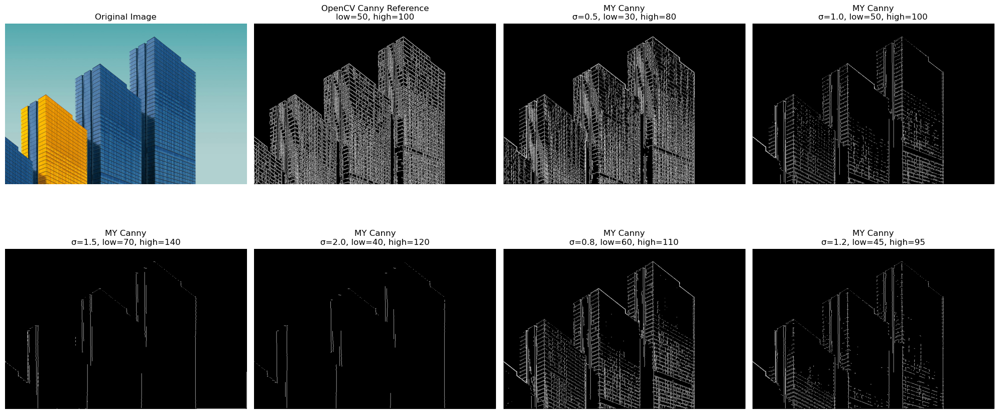


=== CANNY EDGE DETECTION PARAMETER TESTING ===
OpenCV Reference (50-100): 70341 edge pixels

MY σ=0.5, low=30, high=80: 57636 edge pixels
MY σ=1.0, low=50, high=100: 17144 edge pixels
MY σ=1.5, low=70, high=140: 3362 edge pixels
MY σ=2.0, low=40, high=120: 2041 edge pixels
MY σ=0.8, low=60, high=110: 24378 edge pixels
MY σ=1.2, low=45, high=95: 9415 edge pixels

2. Testing MY Hough with multiple parameters...

=== HOUGH TRANSFORM PARAMETER TESTING ===
Skimage Reference: 115 lines detected

MY Hough (threshold=60): 6282 lines detected
MY Hough (threshold=80): 604 lines detected
MY Hough (threshold=100): 135 lines detected
MY Hough (threshold=120): 55 lines detected
MY Hough (threshold=150): 26 lines detected
MY Hough (threshold=180): 15 lines detected
MY Hough (threshold=200): 10 lines detected


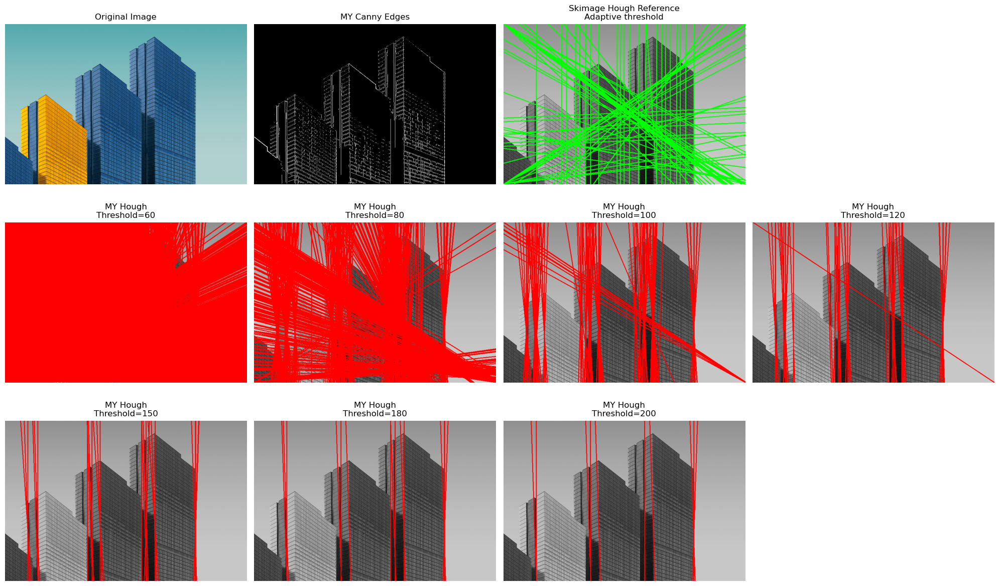


3. Final results with best parameters...


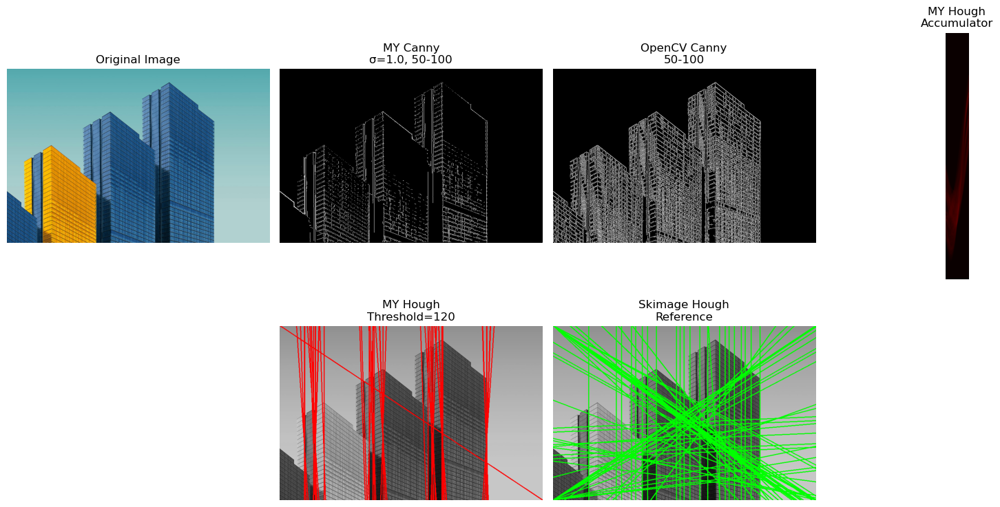


=== FINAL RESULTS ===
MY Canny: 17144 edge pixels
OpenCV Canny: 70341 edge pixels
MY Hough: 55 lines detected
Skimage Hough: 115 lines detected

ANALYZING: object.jpg
Image shape: (200, 200, 3)

1. Testing MY Canny with multiple parameters...


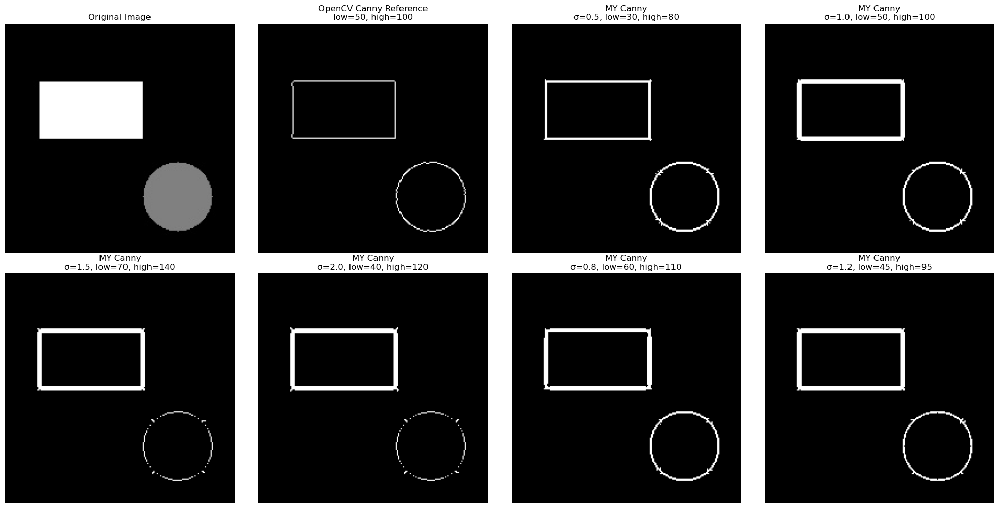


=== CANNY EDGE DETECTION PARAMETER TESTING ===
OpenCV Reference (50-100): 476 edge pixels

MY σ=0.5, low=30, high=80: 932 edge pixels
MY σ=1.0, low=50, high=100: 1462 edge pixels
MY σ=1.5, low=70, high=140: 1251 edge pixels
MY σ=2.0, low=40, high=120: 1241 edge pixels
MY σ=0.8, low=60, high=110: 1351 edge pixels
MY σ=1.2, low=45, high=95: 1439 edge pixels

2. Testing MY Hough with multiple parameters...

=== HOUGH TRANSFORM PARAMETER TESTING ===
Skimage Reference: 2 lines detected

MY Hough (threshold=60): 122 lines detected
MY Hough (threshold=80): 50 lines detected
MY Hough (threshold=100): 0 lines detected
MY Hough (threshold=120): 0 lines detected
MY Hough (threshold=150): 0 lines detected
MY Hough (threshold=180): 0 lines detected
MY Hough (threshold=200): 0 lines detected


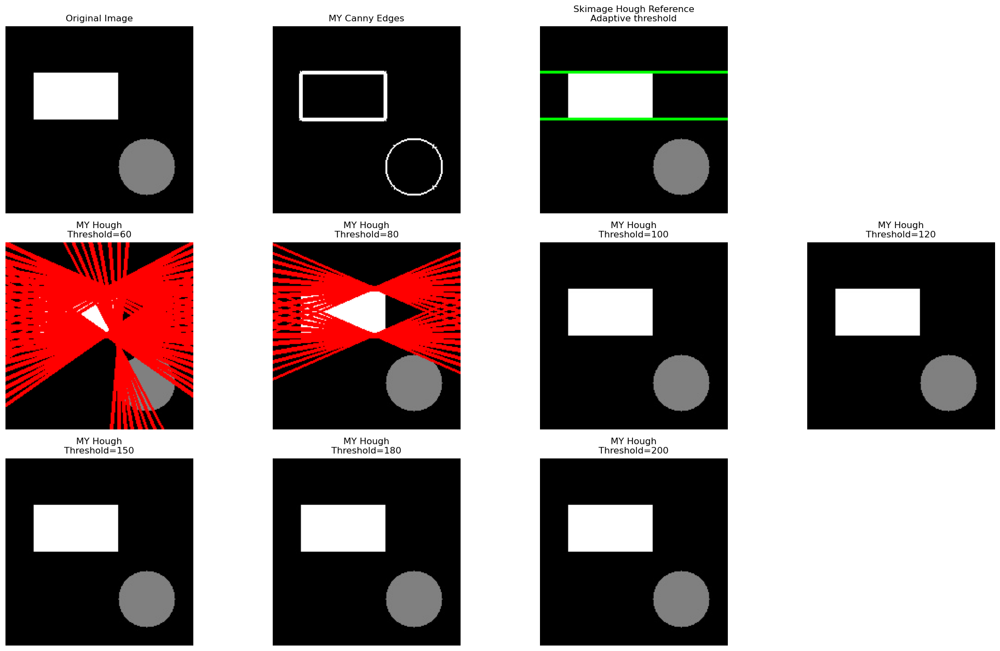


3. Final results with best parameters...


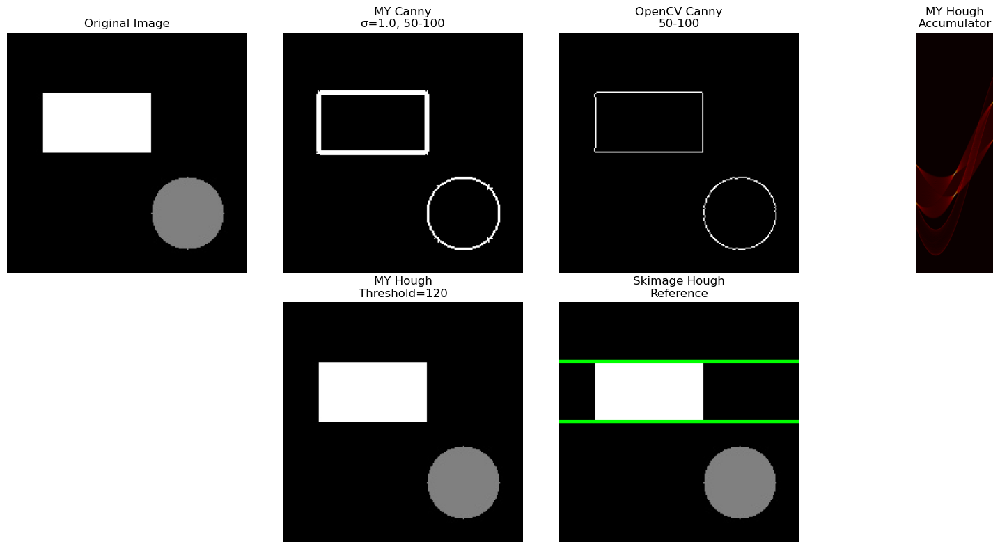


=== FINAL RESULTS ===
MY Canny: 1462 edge pixels
OpenCV Canny: 476 edge pixels
MY Hough: 0 lines detected
Skimage Hough: 2 lines detected

ANALYZING: trees.jpg
Image shape: (2494, 3741, 3)
Resized to: (533, 800, 3)

1. Testing MY Canny with multiple parameters...


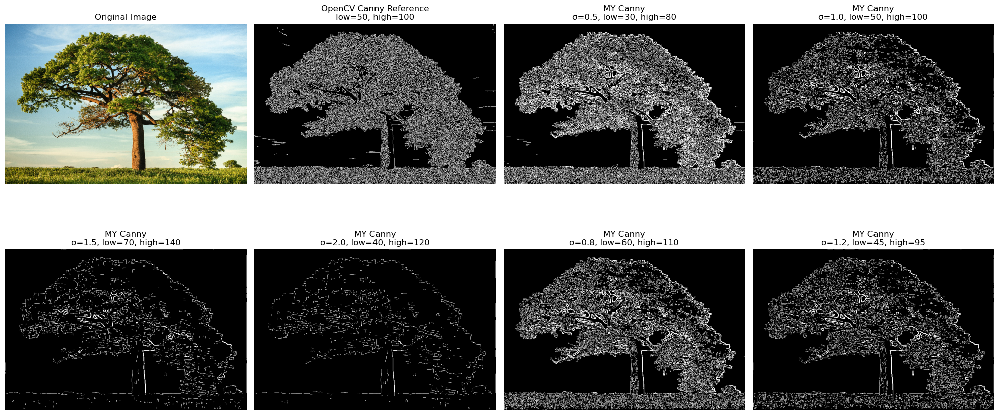


=== CANNY EDGE DETECTION PARAMETER TESTING ===
OpenCV Reference (50-100): 85021 edge pixels

MY σ=0.5, low=30, high=80: 94156 edge pixels
MY σ=1.0, low=50, high=100: 52303 edge pixels
MY σ=1.5, low=70, high=140: 17407 edge pixels
MY σ=2.0, low=40, high=120: 10055 edge pixels
MY σ=0.8, low=60, high=110: 63583 edge pixels
MY σ=1.2, low=45, high=95: 41976 edge pixels

2. Testing MY Hough with multiple parameters...

=== HOUGH TRANSFORM PARAMETER TESTING ===
Skimage Reference: 60 lines detected

MY Hough (threshold=60): 163955 lines detected
MY Hough (threshold=80): 104975 lines detected
MY Hough (threshold=100): 53635 lines detected
MY Hough (threshold=120): 28339 lines detected
MY Hough (threshold=150): 11774 lines detected
MY Hough (threshold=180): 2537 lines detected
MY Hough (threshold=200): 427 lines detected


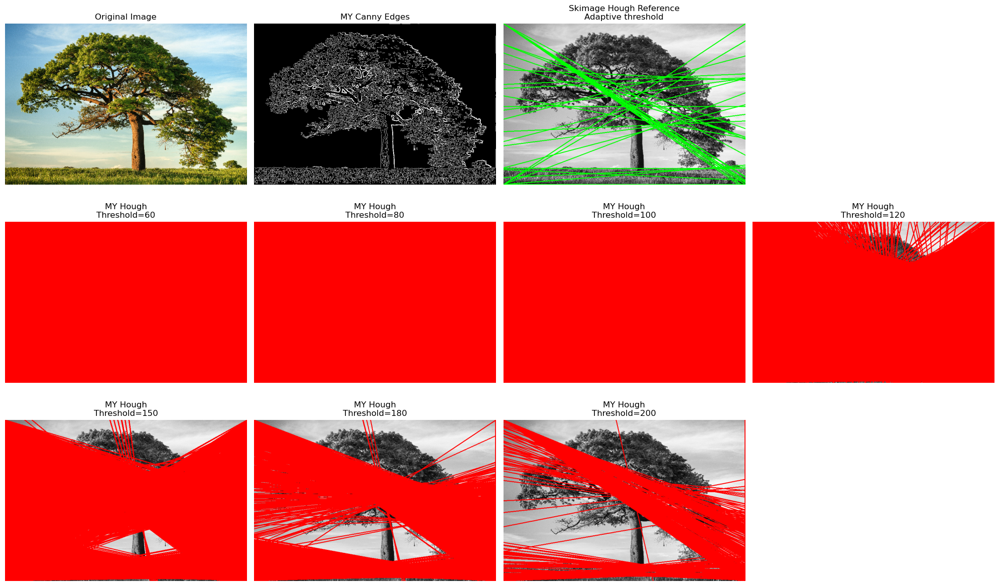


3. Final results with best parameters...


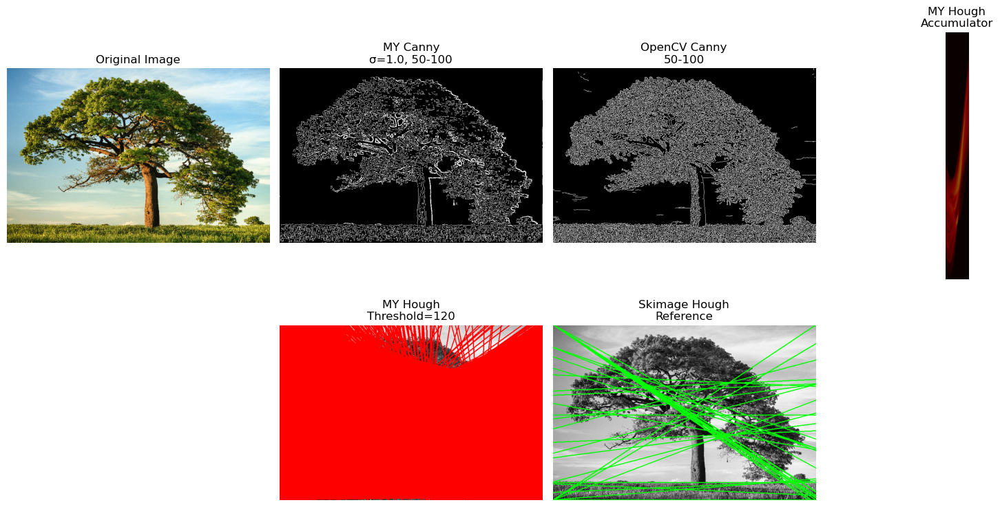


=== FINAL RESULTS ===
MY Canny: 52303 edge pixels
OpenCV Canny: 85021 edge pixels
MY Hough: 28339 lines detected
Skimage Hough: 60 lines detected


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import hough_line, hough_line_peaks

# ---------- Fixed line drawing for skimage results ----------
def draw_skimage_lines(img, angles, dists):
    """
    Draw lines from skimage hough_line_peaks results safely
    """
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    height, width = img.shape
    
    for angle, dist in zip(angles, dists):
        a = np.cos(angle)
        b = np.sin(angle)
        
        if np.abs(b) < 1e-6:  # Nearly horizontal line
            x = int(dist / a) if np.abs(a) > 1e-6 else 0
            x = max(0, min(width-1, x))
            cv2.line(img_color, (x, 0), (x, height-1), (0, 255, 0), 2)
            
        elif np.abs(a) < 1e-6:  # Nearly vertical line
            y = int(dist / b) if np.abs(b) > 1e-6 else 0
            y = max(0, min(height-1, y))
            cv2.line(img_color, (0, y), (width-1, y), (0, 255, 0), 2)
            
        else:
            x0 = a * dist
            y0 = b * dist
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            x1 = max(0, min(width-1, x1))
            y1 = max(0, min(height-1, y1))
            x2 = max(0, min(width-1, x2))
            y2 = max(0, min(height-1, y2))
            cv2.line(img_color, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    return img_color

# ---------- Parameter comparison function ----------
def compare_canny_parameters(img):
    """Test multiple parameters for MY Canny, show one OpenCV reference"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Reference OpenCV parameters
    opencv_low = 50
    opencv_high = 100
    
    # Multiple parameter sets for MY Canny
    param_sets = [
        {"sigma": 0.5, "low": 30, "high": 80, "title": "σ=0.5, low=30, high=80"},
        {"sigma": 1.0, "low": 50, "high": 100, "title": "σ=1.0, low=50, high=100"},
        {"sigma": 1.5, "low": 70, "high": 140, "title": "σ=1.5, low=70, high=140"},
        {"sigma": 2.0, "low": 40, "high": 120, "title": "σ=2.0, low=40, high=120"},
        {"sigma": 0.8, "low": 60, "high": 110, "title": "σ=0.8, low=60, high=110"},
        {"sigma": 1.2, "low": 45, "high": 95, "title": "σ=1.2, low=45, high=95"}
    ]
    
    plt.figure(figsize=(20, 10))
    
    # Original image
    plt.subplot(2, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    # OpenCV Canny reference (only one)
    edges_cv = cv2.Canny(gray, opencv_low, opencv_high)
    plt.subplot(2, 4, 2)
    plt.imshow(edges_cv, cmap="gray")
    plt.title(f"OpenCV Canny Reference\nlow={opencv_low}, high={opencv_high}")
    plt.axis("off")
    
    # MY Canny with multiple parameters (6 variations)
    for i, params in enumerate(param_sets):
        edges_custom = canny(img, sigma=params["sigma"], low=params["low"], high=params["high"])
        plt.subplot(2, 4, i + 3)
        plt.imshow(edges_custom, cmap="gray")
        plt.title(f"MY Canny\n{params['title']}")
        plt.axis("off")
        
        if i >= 5:  # Limit to 6 parameter sets to fit the layout
            break
    
    plt.tight_layout()
    plt.show()
    
    print("\n=== CANNY EDGE DETECTION PARAMETER TESTING ===")
    print(f"OpenCV Reference ({opencv_low}-{opencv_high}): {np.sum(edges_cv > 0)} edge pixels")
    print()
    for i, params in enumerate(param_sets):
        if i >= 6:
            break
        edges_custom = canny(img, sigma=params["sigma"], low=params["low"], high=params["high"])
        custom_pixels = np.sum(edges_custom > 0)
        print(f"MY {params['title']}: {custom_pixels} edge pixels")

def compare_hough_parameters(img):
    """Test multiple parameters for MY Hough, show one skimage reference"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Use consistent Canny parameters for edge detection
    edges_custom = canny(img, sigma=1.0, low=50, high=100)
    edges_cv = cv2.Canny(gray, 50, 100)
    
    # Multiple threshold parameters for MY Hough
    hough_thresholds = [60, 80, 100, 120, 150, 180, 200]
    
    plt.figure(figsize=(20, 12))
    
    # Original and edge images
    plt.subplot(3, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(3, 4, 2)
    plt.imshow(edges_custom, cmap="gray")
    plt.title("MY Canny Edges")
    plt.axis("off")
    
    # Skimage Hough reference (only one)
    h, theta_vals, d = hough_line(edges_cv)
    accum, angles, dists = hough_line_peaks(h, theta_vals, d, threshold=0.6 * np.max(h))
    img_hough_sk = draw_skimage_lines(gray, angles, dists)
    
    plt.subplot(3, 4, 3)
    plt.imshow(cv2.cvtColor(img_hough_sk, cv2.COLOR_BGR2RGB))
    plt.title(f"Skimage Hough Reference\nAdaptive threshold")
    plt.axis("off")
    
    print("\n=== HOUGH TRANSFORM PARAMETER TESTING ===")
    print(f"Skimage Reference: {len(angles)} lines detected")
    print()
    
    # MY Hough with multiple thresholds
    for i, thresh in enumerate(hough_thresholds):
        if i >= 9:  # Limit to fit the layout
            break
            
        acc, rhos, thetas, lines = hough_transform(edges_custom, threshold=thresh)
        img_hough_custom = draw_lines(gray, lines)
        
        row = (i + 1) // 4 + 1
        col = (i + 1) % 4 + 1
        if col == 1 and row > 1:
            col = 1
            
        plt.subplot(3, 4, i + 5)
        plt.imshow(cv2.cvtColor(img_hough_custom, cv2.COLOR_BGR2RGB))
        plt.title(f"MY Hough\nThreshold={thresh}")
        plt.axis("off")
        
        print(f"MY Hough (threshold={thresh}): {len(lines)} lines detected")
    
    plt.tight_layout()
    plt.show()

def final_results(img):
    """Show final results with best parameters"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Best parameters (you can adjust these)
    best_sigma = 1.0
    best_low = 50
    best_high = 100
    best_hough_thresh = 120
    
    # Generate results
    edges_custom = canny(img, sigma=best_sigma, low=best_low, high=best_high)
    edges_cv = cv2.Canny(gray, best_low, best_high)
    
    acc, rhos, thetas, lines = hough_transform(edges_custom, threshold=best_hough_thresh)
    img_hough_custom = draw_lines(gray, lines)
    
    h, theta_vals, d = hough_line(edges_cv)
    accum, angles, dists = hough_line_peaks(h, theta_vals, d, threshold=0.6 * np.max(h))
    img_hough_sk = draw_skimage_lines(gray, angles, dists)
    
    plt.figure(figsize=(16, 8))
    
    plt.subplot(2, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(2, 4, 2)
    plt.imshow(edges_custom, cmap="gray")
    plt.title(f"MY Canny\nσ={best_sigma}, {best_low}-{best_high}")
    plt.axis("off")
    
    plt.subplot(2, 4, 3)
    plt.imshow(edges_cv, cmap="gray")
    plt.title(f"OpenCV Canny\n{best_low}-{best_high}")
    plt.axis("off")
    
    plt.subplot(2, 4, 4)
    plt.imshow(acc, cmap="hot")
    plt.title("MY Hough\nAccumulator")
    plt.axis("off")
    
    plt.subplot(2, 4, 6)
    plt.imshow(cv2.cvtColor(img_hough_custom, cv2.COLOR_BGR2RGB))
    plt.title(f"MY Hough\nThreshold={best_hough_thresh}")
    plt.axis("off")
    
    plt.subplot(2, 4, 7)
    plt.imshow(cv2.cvtColor(img_hough_sk, cv2.COLOR_BGR2RGB))
    plt.title("Skimage Hough\nReference")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n=== FINAL RESULTS ===")
    print(f"MY Canny: {np.sum(edges_custom > 0)} edge pixels")
    print(f"OpenCV Canny: {np.sum(edges_cv > 0)} edge pixels")
    print(f"MY Hough: {len(lines)} lines detected")
    print(f"Skimage Hough: {len(angles)} lines detected")

if __name__ == "__main__":
    image_paths = [
        "building.jpg",
        "object.jpg", 
        "trees.jpg",
    ]
    
    for img_path in image_paths:
        try:
            img = cv2.imread(img_path)
            if img is None:
                print(f"Could not load {img_path}, skipping...")
                continue
                
            print(f"\n{'='*60}")
            print(f"ANALYZING: {img_path}")
            print(f"Image shape: {img.shape}")
            print(f"{'='*60}")
            
            height, width = img.shape[:2]
            if height > 800 or width > 800:
                scale = min(800/height, 800/width)
                new_height, new_width = int(height * scale), int(width * scale)
                img = cv2.resize(img, (new_width, new_height))
                print(f"Resized to: {img.shape}")
            
            print("\n1. Testing MY Canny with multiple parameters...")
            compare_canny_parameters(img)
            
            print("\n2. Testing MY Hough with multiple parameters...")
            compare_hough_parameters(img)
            
            print("\n3. Final results with best parameters...")
            final_results(img)
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue


ANALYZING: building.jpg
Image shape: (1700, 2560, 3)
Resized to: (531, 800, 3)

1. Comparing Canny parameters...


KeyboardInterrupt: 

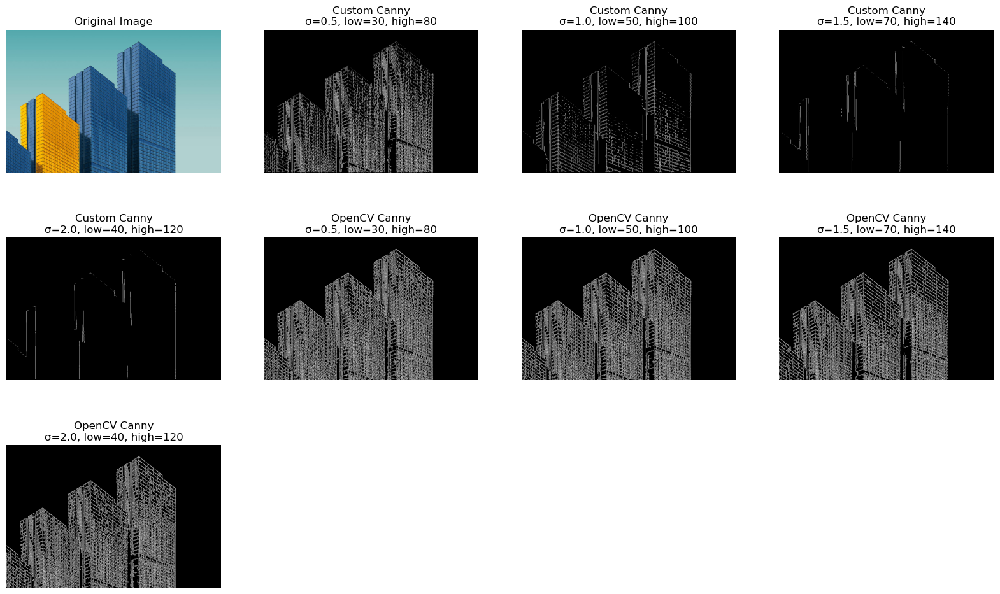

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import hough_line, hough_line_peaks

# # === Import your implementations ===
# from canny import canny     # your custom Canny function
# from hough import hough_transform, draw_lines  # your custom Hough

# ---------- Fixed line drawing for skimage results ----------
def draw_skimage_lines(img, angles, dists):
    """
    Draw lines from skimage hough_line_peaks results safely
    """
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    height, width = img.shape
    
    for angle, dist in zip(angles, dists):
        # Convert angle and distance to line parameters
        a = np.cos(angle)
        b = np.sin(angle)
        
        # Handle different cases to avoid division by zero
        if np.abs(b) < 1e-6:  # Nearly horizontal line (sin ≈ 0)
            # Line is nearly vertical: x = dist/cos(angle)
            x = int(dist / a) if np.abs(a) > 1e-6 else 0
            x = max(0, min(width-1, x))  # Clamp to image bounds
            cv2.line(img_color, (x, 0), (x, height-1), (0, 255, 0), 2)
            
        elif np.abs(a) < 1e-6:  # Nearly vertical line (cos ≈ 0)
            # Line is nearly horizontal: y = dist/sin(angle)
            y = int(dist / b) if np.abs(b) > 1e-6 else 0
            y = max(0, min(height-1, y))  # Clamp to image bounds
            cv2.line(img_color, (0, y), (width-1, y), (0, 255, 0), 2)
            
        else:  # General case
            # Calculate two points on the line
            x0 = a * dist
            y0 = b * dist
            
            # Extend line in both directions
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * a)
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * a)
            
            cv2.line(img_color, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    return img_color

# ---------- Parameter comparison function ----------
def compare_canny_parameters(img):
    """Compare Canny edge detection with different parameters"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Different parameter sets for comparison
    param_sets = [
        {"sigma": 0.5, "low": 30, "high": 80, "title": "σ=0.5, low=30, high=80"},
        {"sigma": 1.0, "low": 50, "high": 100, "title": "σ=1.0, low=50, high=100"},
        {"sigma": 1.5, "low": 70, "high": 140, "title": "σ=1.5, low=70, high=140"},
        {"sigma": 2.0, "low": 40, "high": 120, "title": "σ=2.0, low=40, high=120"}
    ]
    
    plt.figure(figsize=(20, 12))
    
    # Show original image
    plt.subplot(3, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    # Show custom Canny results
    for i, params in enumerate(param_sets):
        edges_custom = canny(img, sigma=params["sigma"], low=params["low"], high=params["high"])
        plt.subplot(3, 4, i + 2)
        plt.imshow(edges_custom, cmap="gray")
        plt.title(f"Custom Canny\n{params['title']}")
        plt.axis("off")
    
    # Show OpenCV Canny results for comparison
    for i, params in enumerate(param_sets):
        edges_cv = cv2.Canny(gray, params["low"], params["high"])
        plt.subplot(3, 4, i + 6)
        plt.imshow(edges_cv, cmap="gray")
        plt.title(f"OpenCV Canny\n{params['title']}")
        plt.axis("off")
    
    # Show difference (Custom - OpenCV) for first parameter set
    edges_custom_ref = canny(img, sigma=param_sets[0]["sigma"], low=param_sets[0]["low"], high=param_sets[0]["high"])
    edges_cv_ref = cv2.Canny(gray, param_sets[0]["low"], param_sets[0]["high"])
    
    plt.subplot(3, 4, 10)
    diff = np.abs(edges_custom_ref.astype(float) - edges_cv_ref.astype(float))
    plt.imshow(diff, cmap="hot")
    plt.title("Difference\n(Custom - OpenCV)")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print("\n=== CANNY EDGE DETECTION COMPARISON ===")
    for i, params in enumerate(param_sets):
        edges_custom = canny(img, sigma=params["sigma"], low=params["low"], high=params["high"])
        edges_cv = cv2.Canny(gray, params["low"], params["high"])
        custom_pixels = np.sum(edges_custom > 0)
        cv_pixels = np.sum(edges_cv > 0)
        print(f"Params {params['title']}:")
        print(f"  Custom: {custom_pixels} edge pixels")
        print(f"  OpenCV: {cv_pixels} edge pixels")
        print(f"  Difference: {custom_pixels - cv_pixels} pixels")

def compare_hough_parameters(img):
    """Compare Hough Transform with different parameters"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Use consistent Canny parameters for fair comparison
    edges_custom = canny(img, sigma=1.0, low=50, high=100)
    edges_cv = cv2.Canny(gray, 50, 100)
    
    # Different threshold values for Hough transform
    hough_thresholds = [60, 100, 150, 200]
    
    plt.figure(figsize=(20, 10))
    
    # Show edge images
    plt.subplot(2, 5, 1)
    plt.imshow(edges_custom, cmap="gray")
    plt.title("Custom Canny Edges")
    plt.axis("off")
    
    plt.subplot(2, 5, 6)
    plt.imshow(edges_cv, cmap="gray")
    plt.title("OpenCV Canny Edges")
    plt.axis("off")
    
    print("\n=== HOUGH TRANSFORM COMPARISON ===")
    
    # Show custom Hough results with different thresholds
    for i, thresh in enumerate(hough_thresholds):
        # Custom implementation
        acc, rhos, thetas, lines = hough_transform(edges_custom, threshold=thresh)
        img_hough_custom = draw_lines(gray, lines)
        
        plt.subplot(2, 5, i + 2)
        plt.imshow(cv2.cvtColor(img_hough_custom, cv2.COLOR_BGR2RGB))
        plt.title(f"Custom Hough\nThreshold={thresh}")
        plt.axis("off")
        
        # Skimage implementation
        h, theta_vals, d = hough_line(edges_cv)
        # Adjust threshold as percentage of max accumulator value
        thresh_ratio = thresh / 200.0  # normalize to 0-1 range
        accum, angles, dists = hough_line_peaks(h, theta_vals, d, threshold=thresh_ratio * np.max(h))
        img_hough_sk = draw_skimage_lines(gray, angles, dists)
        
        plt.subplot(2, 5, i + 7)
        plt.imshow(cv2.cvtColor(img_hough_sk, cv2.COLOR_BGR2RGB))
        plt.title(f"Skimage Hough\nThreshold={thresh}")
        plt.axis("off")
        
        print(f"Threshold {thresh}:")
        print(f"  Custom: {len(lines)} lines detected")
        print(f"  Skimage: {len(angles)} lines detected")
    
    plt.tight_layout()
    plt.show()

def comprehensive_comparison(img):
    """Show a comprehensive comparison with the best parameters"""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Best parameters (you can adjust these)
    best_sigma = 1.0
    best_low = 50
    best_high = 100
    best_hough_thresh = 120
    
    # Generate results
    edges_custom = canny(img, sigma=best_sigma, low=best_low, high=best_high)
    edges_cv = cv2.Canny(gray, best_low, best_high)
    
    acc, rhos, thetas, lines = hough_transform(edges_custom, threshold=best_hough_thresh)
    img_hough_custom = draw_lines(gray, lines)
    
    h, theta_vals, d = hough_line(edges_cv)
    accum, angles, dists = hough_line_peaks(h, theta_vals, d, threshold=0.6 * np.max(h))
    img_hough_sk = draw_skimage_lines(gray, angles, dists)
    
    # Display results
    plt.figure(figsize=(20, 8))
    
    plt.subplot(2, 4, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(2, 4, 2)
    plt.imshow(edges_custom, cmap="gray")
    plt.title(f"Custom Canny\nσ={best_sigma}, {best_low}-{best_high}")
    plt.axis("off")
    
    plt.subplot(2, 4, 3)
    plt.imshow(edges_cv, cmap="gray")
    plt.title(f"OpenCV Canny\n{best_low}-{best_high}")
    plt.axis("off")
    
    plt.subplot(2, 4, 4)
    diff = np.abs(edges_custom.astype(float) - edges_cv.astype(float))
    plt.imshow(diff, cmap="hot")
    plt.title("Edge Difference\n(Custom - OpenCV)")
    plt.axis("off")
    
    plt.subplot(2, 4, 6)
    plt.imshow(cv2.cvtColor(img_hough_custom, cv2.COLOR_BGR2RGB))
    plt.title(f"Custom Hough\nThreshold={best_hough_thresh}")
    plt.axis("off")
    
    plt.subplot(2, 4, 7)
    plt.imshow(cv2.cvtColor(img_hough_sk, cv2.COLOR_BGR2RGB))
    plt.title(f"Skimage Hough\nAdaptive threshold")
    plt.axis("off")
    
    plt.subplot(2, 4, 8)
    plt.imshow(acc, cmap="hot")
    plt.title("Custom Hough\nAccumulator")
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n=== COMPREHENSIVE RESULTS ===")
    print(f"Custom Canny: {np.sum(edges_custom > 0)} edge pixels")
    print(f"OpenCV Canny: {np.sum(edges_cv > 0)} edge pixels")
    print(f"Custom Hough: {len(lines)} lines detected")
    print(f"Skimage Hough: {len(angles)} lines detected")

# ---------- Main ----------
if __name__ == "__main__":
    
    # Add your image paths here
    image_paths = [
        "building.jpg",    # façade with strong lines
        "object.jpg",      # simple object
        "trees.jpg",       # natural scene
        # Add more paths as needed
    ]
    
    for img_path in image_paths:
        try:
            img = cv2.imread(img_path)
            if img is None:
                print(f"Could not load {img_path}, skipping...")
                continue
                
            print(f"\n{'='*60}")
            print(f"ANALYZING: {img_path}")
            print(f"Image shape: {img.shape}")
            print(f"{'='*60}")
            
            # Resize image if too large (for better visualization)
            height, width = img.shape[:2]
            if height > 800 or width > 800:
                scale = min(800/height, 800/width)
                new_height, new_width = int(height * scale), int(width * scale)
                img = cv2.resize(img, (new_width, new_height))
                print(f"Resized to: {img.shape}")
            
            # Run different comparisons
            print("\n1. Comparing Canny parameters...")
            compare_canny_parameters(img)
            
            print("\n2. Comparing Hough parameters...")
            compare_hough_parameters(img)
            
            print("\n3. Comprehensive comparison...")
            comprehensive_comparison(img)
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue
    
    if not image_paths or all(cv2.imread(path) is None for path in image_paths):
        print("\nNo valid images found. Please check your image paths:")
        for path in image_paths:
            print(f"  - {path}")
        print("\nMake sure the image files exist in the current directory or provide full paths.")

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import hough_line, hough_line_peaks
# from skimage.feature import canny   # Uncomment if you want to use skimage's Canny

# ---------- Fixed line drawing for skimage results ----------
def draw_skimage_lines(img, angles, dists):
    """
    Draw lines from skimage hough_line_peaks results safely
    """
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    height, width = img.shape
    
    for angle, dist in zip(angles, dists):
        a = np.cos(angle)
        b = np.sin(angle)
        
        if np.abs(b) < 1e-6:  # Nearly horizontal line
            x = int(dist / a) if np.abs(a) > 1e-6 else 0
            x = max(0, min(width-1, x))
            cv2.line(img_color, (x, 0), (x, height-1), (0, 255, 0), 2)
            
        elif np.abs(a) < 1e-6:  # Nearly vertical line
            y = int(dist / b) if np.abs(b) > 1e-6 else 0
            y = max(0, min(height-1, y))
            cv2.line(img_color, (0, y), (width-1, y), (0, 255, 0), 2)
            
        else:
            x0 = a * dist
            y0 = b * dist
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            x1 = max(0, min(width-1, x1))
            y1 = max(0, min(height-1, y1))
            x2 = max(0, min(width-1, x2))
            y2 = max(0, min(height-1, y2))
            cv2.line(img_color, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    return img_color

# ---------- Direct OpenCV Hough Transform (your scratch part) ----------
def opencv_hough_transform(img_path):
    """
    Direct Hough Line Detection using OpenCV (your original scratch code adapted).
    """
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    if img is None:
        print(f"Could not load {img_path}")
        return None
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 200)
    
    # Probabilistic Hough Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, 68, minLineLength=15, maxLineGap=250)
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(img, (x1, y1), (x2, y2), (255, 0, 0), 3)
    
    print("Line Detection using Hough Transform (OpenCV)")
    cv2.imshow("OpenCV Hough Lines", img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    return img

# ---------- Main driver ----------
if __name__ == "__main__":
    # You can swap this with your own test images
    image_paths = [
         # <-- your original test case
        "building.jpg",
        "object.jpg", 
        "trees.jpg",
    ]
    
    for img_path in image_paths:
        try:
            print(f"\n{'='*60}")
            print(f"ANALYZING: {img_path}")
            print(f"{'='*60}")
            
            # Run OpenCV Hough Transform (your scratch version)
            opencv_hough_transform(img_path)
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue



ANALYZING: building.jpg
Line Detection using Hough Transform (OpenCV)

ANALYZING: object.jpg
Line Detection using Hough Transform (OpenCV)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import hough_line, hough_line_peaks

# ---------- Skimage drawing helper ----------
def draw_skimage_lines(img, angles, dists):
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    height, width = img.shape
    
    for angle, dist in zip(angles, dists):
        a = np.cos(angle)
        b = np.sin(angle)
        
        if np.abs(b) < 1e-6:
            x = int(dist / a) if np.abs(a) > 1e-6 else 0
            x = max(0, min(width-1, x))
            cv2.line(img_color, (x, 0), (x, height-1), (0, 255, 0), 2)
        elif np.abs(a) < 1e-6:
            y = int(dist / b) if np.abs(b) > 1e-6 else 0
            y = max(0, min(height-1, y))
            cv2.line(img_color, (0, y), (width-1, y), (0, 255, 0), 2)
        else:
            x0 = a * dist
            y0 = b * dist
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            x1 = max(0, min(width-1, x1))
            y1 = max(0, min(height-1, y1))
            x2 = max(0, min(width-1, x2))
            y2 = max(0, min(height-1, y2))
            cv2.line(img_color, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    return img_color

# ---------- My Hough (OpenCV) ----------
def my_hough(img_gray, threshold):
    edges = cv2.Canny(img_gray, 50, 200)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold,
                            minLineLength=15, maxLineGap=250)
    
    img_color = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
    if lines is not None:
        for x1, y1, x2, y2 in lines[:,0]:
            cv2.line(img_color, (x1, y1), (x2, y2), (255, 0, 0), 2)
    return img_color

# ---------- Skimage Hough ----------
def skimage_hough(img_gray):
    h, theta, d = hough_line(img_gray)
    accum, angles, dists = hough_line_peaks(h, theta, d)
    return draw_skimage_lines(img_gray, angles, dists)

# ---------- Comparison driver ----------
def compare_hough(image_path, hough_thresholds):
    # Load grayscale
    img_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img_gray is None:
        print(f"Could not load {image_path}")
        return
    
    fig, axes = plt.subplots(len(hough_thresholds), 2, figsize=(10, 4*len(hough_thresholds)))
    
    for i, th in enumerate(hough_thresholds):
        opencv_result = my_hough(img_gray, th)
        ski_result = skimage_hough(img_gray)
        
        axes[i,0].imshow(cv2.cvtColor(opencv_result, cv2.COLOR_BGR2RGB))
        axes[i,0].set_title(f"My Hough (OpenCV) - th={th}")
        axes[i,0].axis("off")
        
        axes[i,1].imshow(cv2.cvtColor(ski_result, cv2.COLOR_BGR2RGB))
        axes[i,1].set_title("Skimage Hough")
        axes[i,1].axis("off")
    
    plt.tight_layout()
    plt.show()

# ---------- Run ----------
hough_thresholds = [60, 80, 100, 120, 150, 180, 200]
compare_hough("building.jpg", hough_thresholds)
compare_hough("object.jpg", hough_thresholds)
compare_hough("trees.jpg", hough_thresholds)